# 052 — Model comparison

User selected models comparison over the images in `data/test/`.  

For every image:
-  `raw delta` / `structural delta` signals compared side by side across the selected models
- `|z|` / `structural-z` comparisons for the heteroscedastic models 
- a mask-free stroke-coherence ranking.

Imports and a GPU sanity check.


In [1]:
import sys
from pathlib import Path

project_root = Path().absolute()
if project_root.name == "notebooks":
    project_root = project_root.parent
sys.path.insert(0, str(project_root))

import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf
from PIL import Image

from scripts.calibration import laplace_sigma_from_scale, learned_zscore, structural_zscore
from scripts.config import settings
from scripts.dataset import pad_to_multiple
from scripts.delta_analysis import analyze_delta
from scripts.stroke_stats import stroke_coherence
from scripts.trainer import load_model
from scripts.trainer_nll import load_model_nll
from scripts.visualization_nll import DEFAULT_Z_SCALE, plot_signal_comparison

gpus = tf.config.list_physical_devices("GPU")
print(f"GPUs available: {gpus}")

GPUs available: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


## 1. Every test image

Every `(rgb, ir)` pair under `data/test/`.


In [2]:
TEST_RGB_DIR = project_root / "data" / "test" / "rgb"
TEST_IR_DIR = project_root / "data" / "test" / "ir"

rgb_paths = sorted(TEST_RGB_DIR.glob("*.jpg")) if TEST_RGB_DIR.exists() else []
rgb_paths += sorted(TEST_RGB_DIR.glob("*.png")) if TEST_RGB_DIR.exists() else []
image_pairs = [
    (p, TEST_IR_DIR / p.name)
    for p in sorted(rgb_paths)
    if (TEST_IR_DIR / p.name).exists()
]

print(f"data/test/ images: {len(image_pairs)} | {[p.stem for p, _ in image_pairs]}")

if not image_pairs:
    raise RuntimeError("No (rgb, ir) pairs found under data/test/.")

data/test/ images: 10 | ['GT01', 'GT02', 'GT03', 'bridge', 'case', 'face', 'green', 'modern', 'modern2', 'total']


## 2. Choose which models to compare

Each entry is `(architecture, family, loss)`:
- `architecture` is the model name used across the project  
- `family` is `"deterministic"` or `"nll"`  
- `loss` is `"laplace_nll"` for every heteroscedastic architecture. 


In [3]:
MODELS = [
    # ---- deterministic ----
    ("unet", "deterministic", None),
    #("unet_residual", "deterministic", None),
    ("resunet", "deterministic", None),
    #("attention_unet", "deterministic", None),
    #("efficientnet_unet", "deterministic", None),
    #("efficientnet_unet_ft", "deterministic", None),
    #("unet_v2", "deterministic", None),
    #("unet_restormer", "deterministic", None),
    #("unet_dilated", "deterministic", None),
    #("unet_v2_dilated", "deterministic", None),
    # ---- heteroscedastic (NLL) ----
    #("unet_nll", "nll", "laplace_nll"),
    ("resunet_nll", "nll", "laplace_nll"),
    ("attention_unet_nll", "nll", "laplace_nll"),
    #("efficientnet_unet_nll", "nll", "laplace_nll"),
    #("efficientnet_unet_nll_ft", "nll", "laplace_nll"),
]
BETA = settings.NLL_BETA


def display_name(arch: str, family: str, loss: str | None) -> str:
    # Every NLL entry is "laplace_nll" now (fixing.md #10); no more
    # gaussian/beta variant suffix needed, so this is just the arch name.
    return arch


models: dict = {}
model_family: dict[str, str] = {}

for arch, family, loss in MODELS:
    name = display_name(arch, family, loss)
    try:
        if family == "deterministic":
            models[name] = load_model(
                arch, model_dir=settings.MODELS_DIR / "deterministic"
            )
        else:
            models[name] = load_model_nll(
                arch, model_dir=settings.MODELS_DIR / "nll", loss_name=loss, beta=BETA
            )
    except FileNotFoundError as exc:
        print(f"[skip] {exc}")
        continue
    model_family[name] = family

print(f"Comparing: {list(models)}")
if not models:
    raise RuntimeError("None of the models in MODELS have a checkpoint on disk.")


2026-09-06 12:29:25.824104: I metal_plugin/src/device/metal_device.cc:1154] Metal device set to: Apple M4 Max
2026-09-06 12:29:25.824133: I metal_plugin/src/device/metal_device.cc:296] systemMemory: 36.00 GB
2026-09-06 12:29:25.824138: I metal_plugin/src/device/metal_device.cc:313] maxCacheSize: 14.04 GB
2026-09-06 12:29:25.824155: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2026-09-06 12:29:25.824166: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


Comparing: ['unet', 'resunet', 'resunet_nll', 'attention_unet_nll']


## 3. Build signals

- `raw delta` and `structural delta` for every selected model  
- `|z|`and `structural z` only for the heteroscedastic models  


In [4]:
def load_pair(rgb_path: Path, ir_path: Path) -> tuple[np.ndarray, np.ndarray]:
    rgb = np.array(Image.open(rgb_path).convert("RGB")).astype(np.float32) / 255.0
    ir = np.array(Image.open(ir_path).convert("L")).astype(np.float32) / 255.0
    return rgb, ir


def signals_for(rgb: np.ndarray, ir: np.ndarray) -> dict[str, dict[str, np.ndarray]]:
    padded, _ = pad_to_multiple(tf.constant(rgb), multiple=settings.PATCH_MULTIPLE)
    h, w = ir.shape
    batch = padded[tf.newaxis, ...]

    raw, structural, z, struct_z = {}, {}, {}, {}
    for name, model in models.items():
        pred = model.predict(batch, verbose=0)[0, :h, :w, :]
        is_nll = model_family[name] == "nll"
        mu = pred[..., 0]
        result = analyze_delta(ir, mu)

        raw[name] = result.raw_delta
        structural[name] = result.structural_delta
        if is_nll:
            # Every NLL architecture trains as Laplace since fixing.md #10's
            # Round 2 collapse, so laplace_sigma_from_scale applies uniformly.
            sigma = laplace_sigma_from_scale(np.exp(pred[..., 1]))
            z[name] = learned_zscore(ir, mu, sigma)
            struct_z[name] = structural_zscore(result.structural_delta, sigma)
    return {
        "raw delta": raw,
        "structural delta": structural,
        "|z| (raw/sigma)": z,
        "structural z": struct_z,
    }

## 4. Visual comparison



=== GT01 ===


2026-09-06 12:29:28.153917: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:117] Plugin optimizer for device_type GPU is enabled.


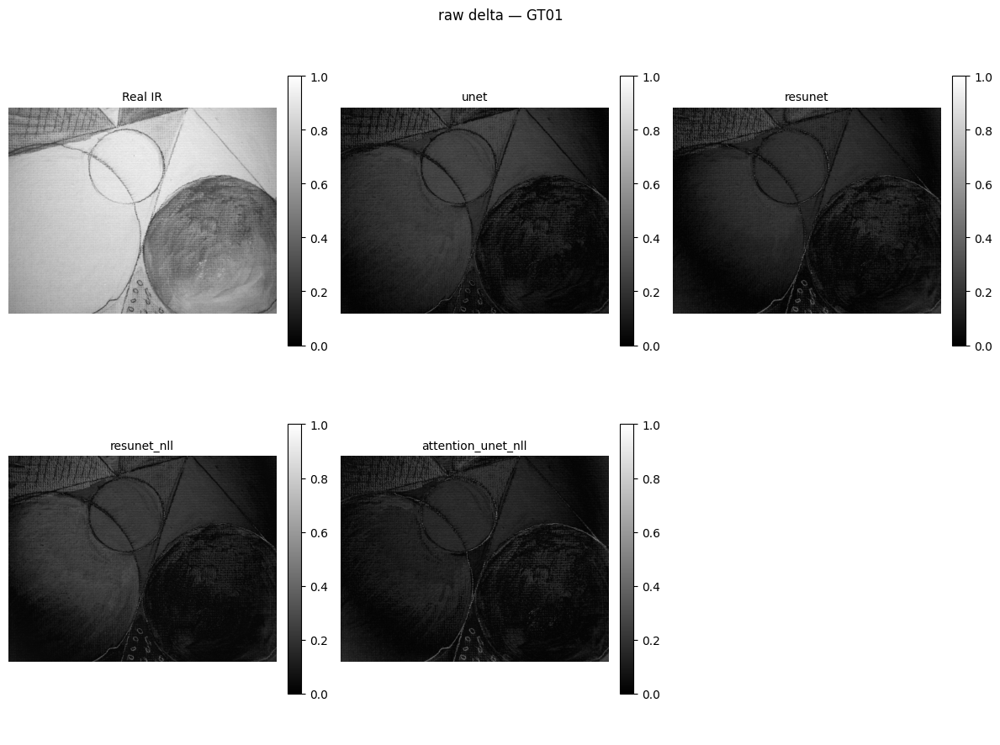

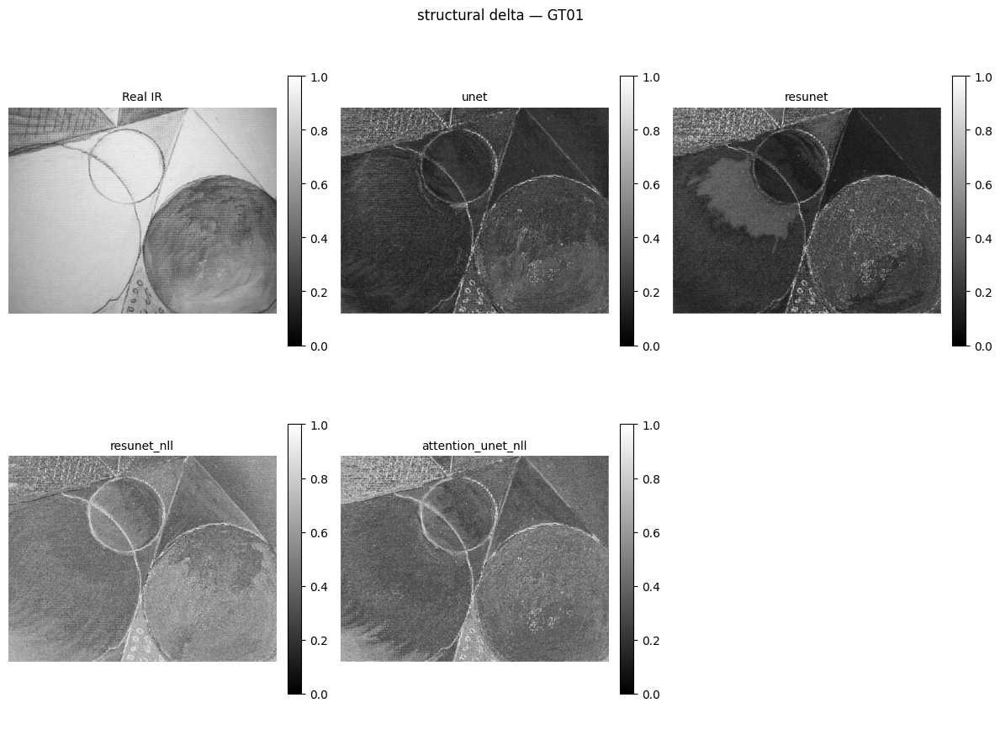

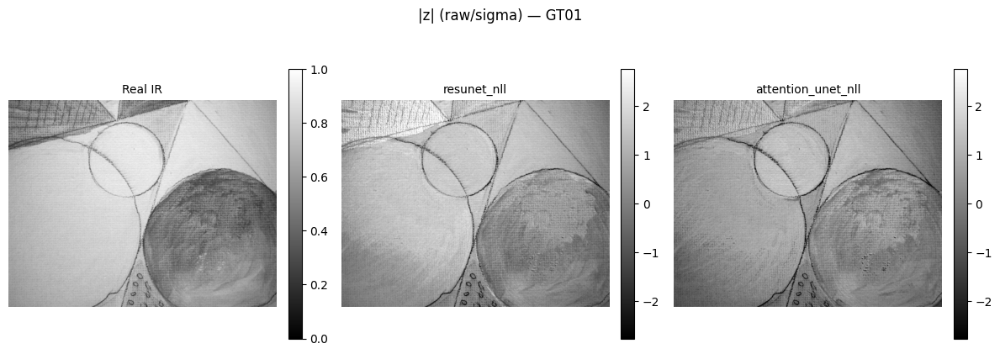

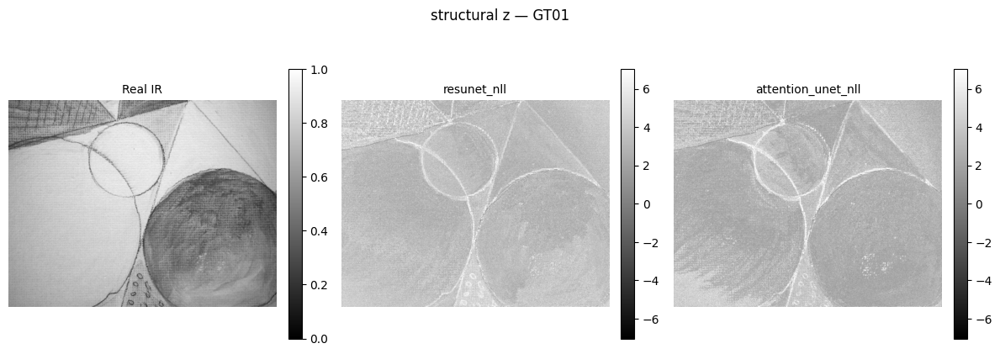


=== GT02 ===


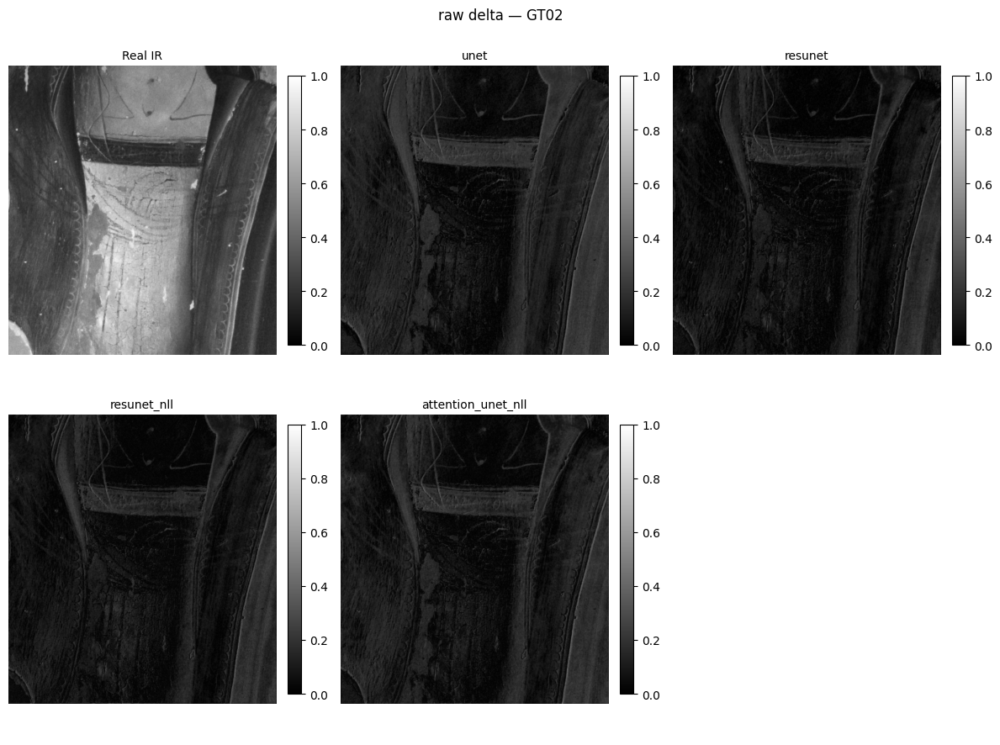

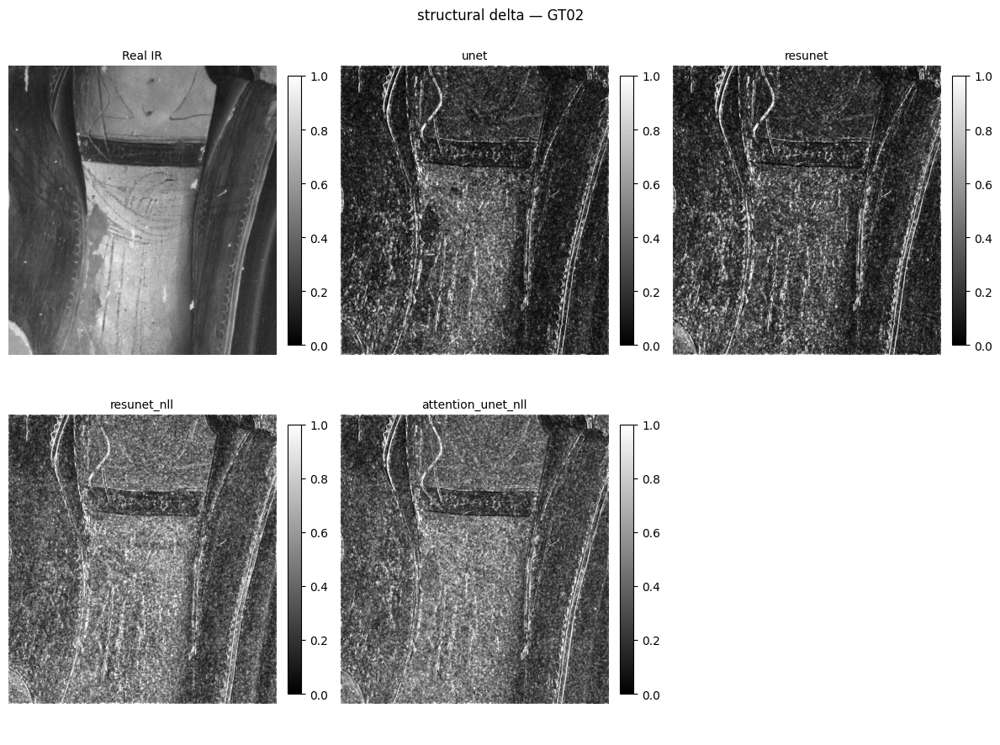

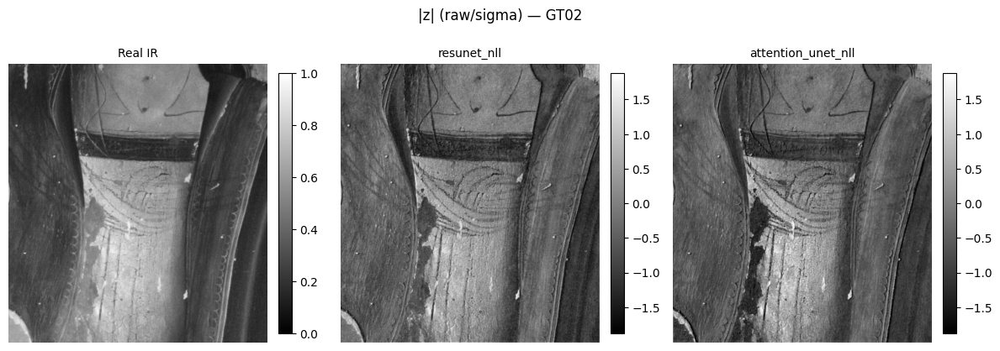

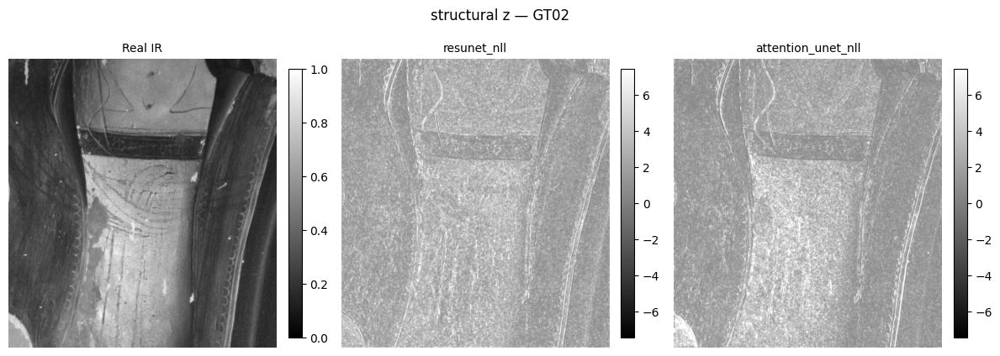


=== GT03 ===


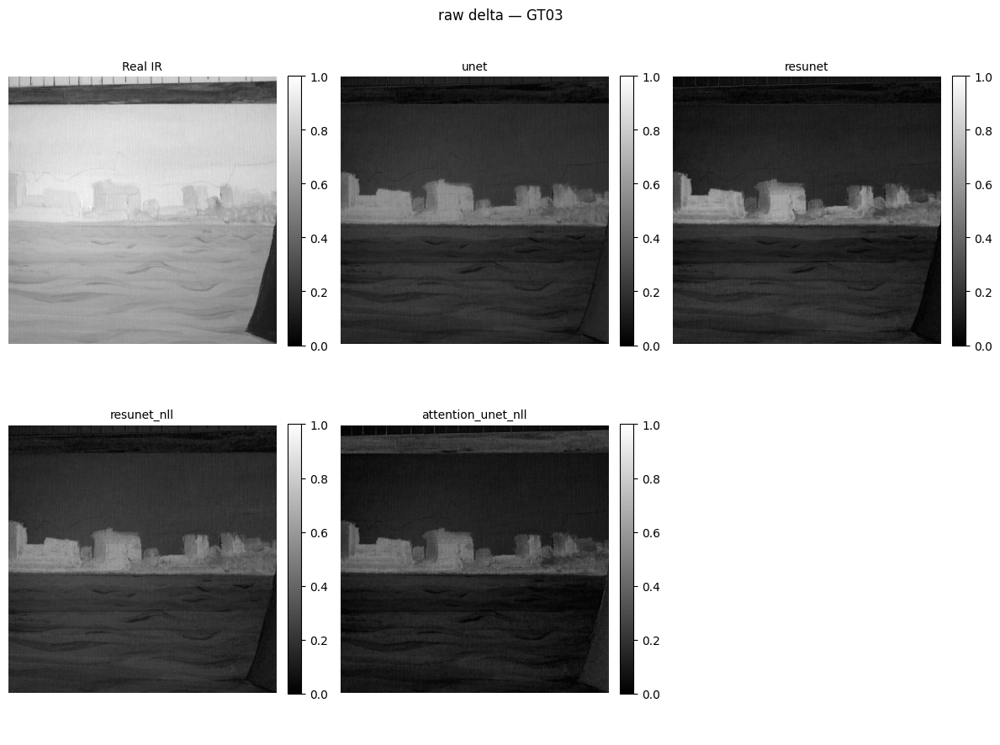

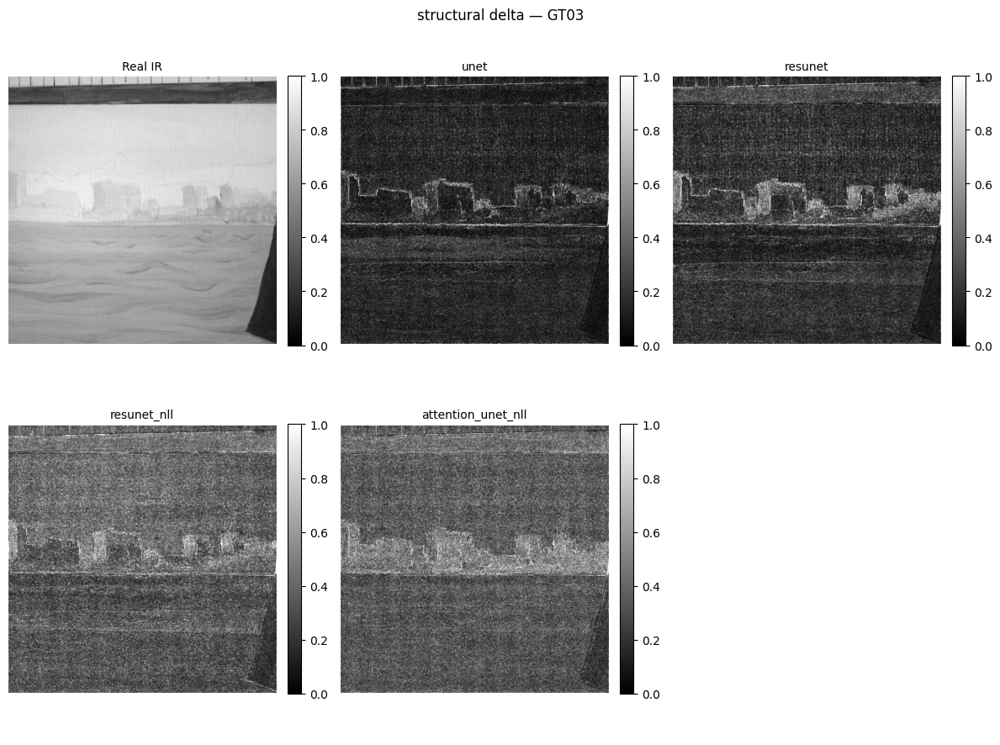

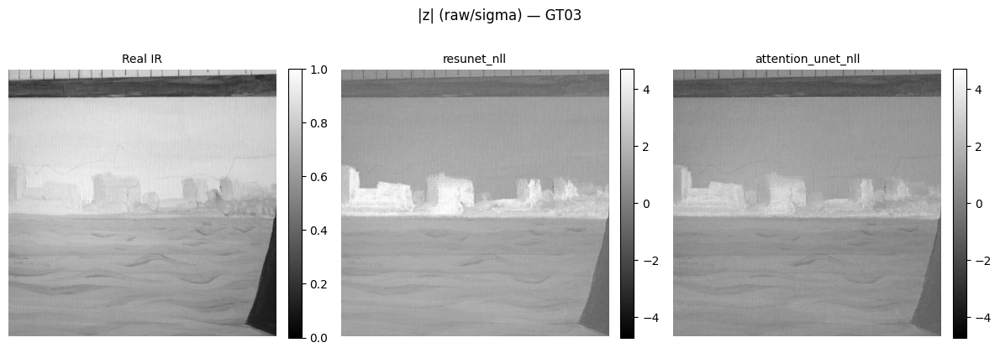

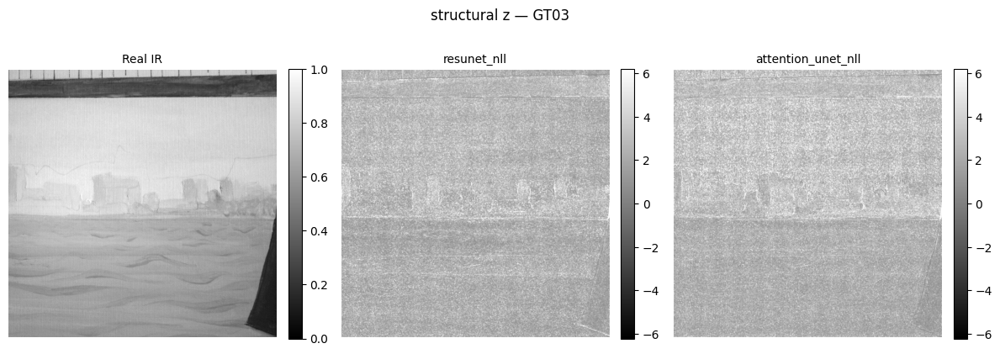


=== bridge ===


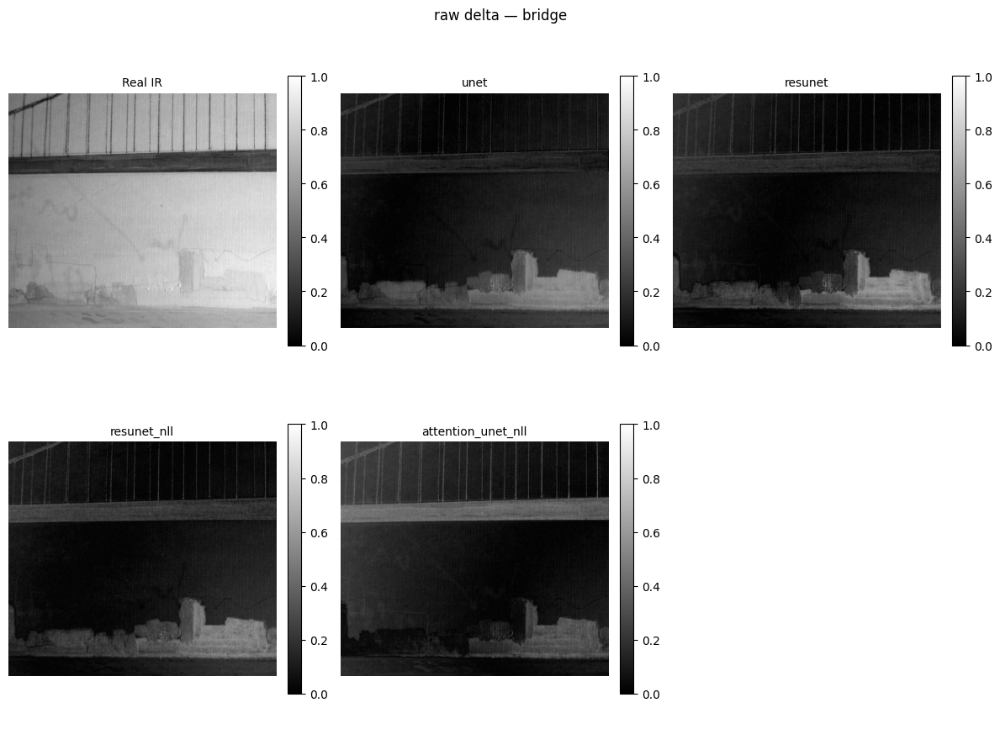

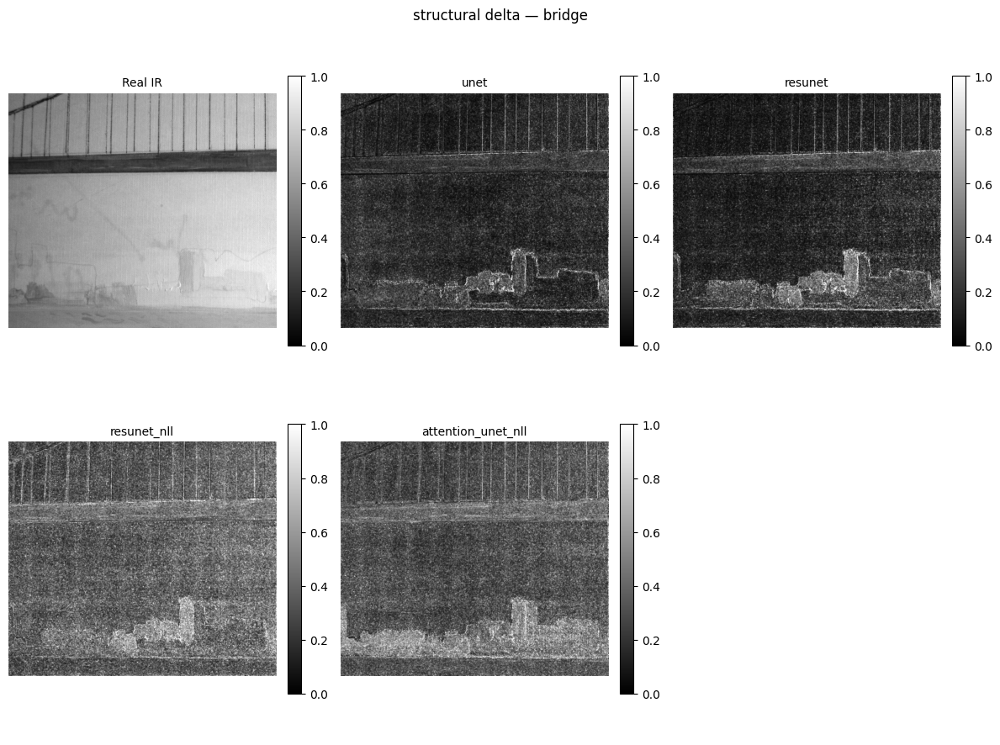

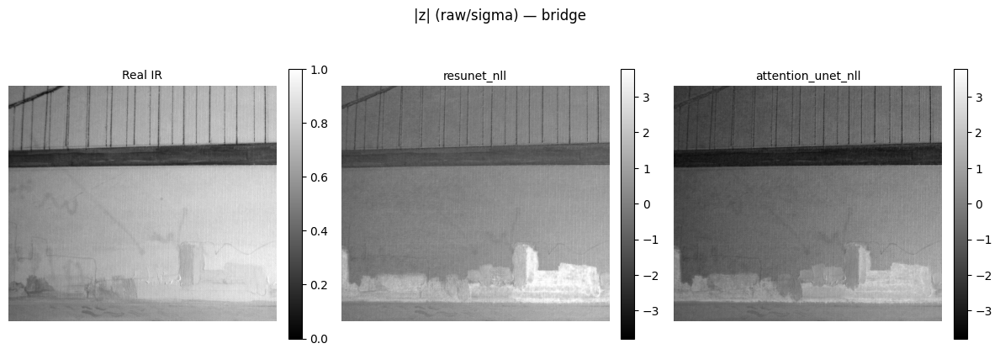

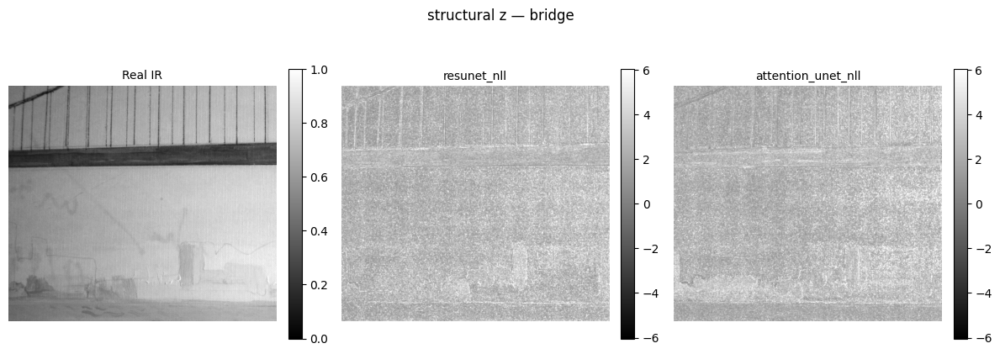


=== case ===


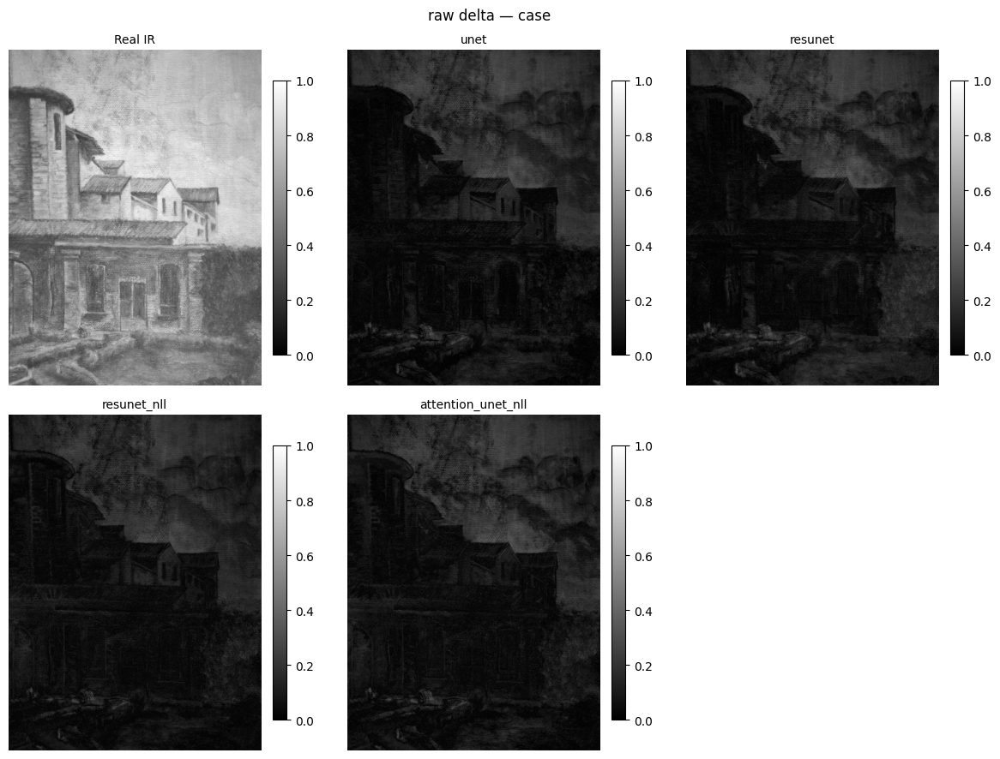

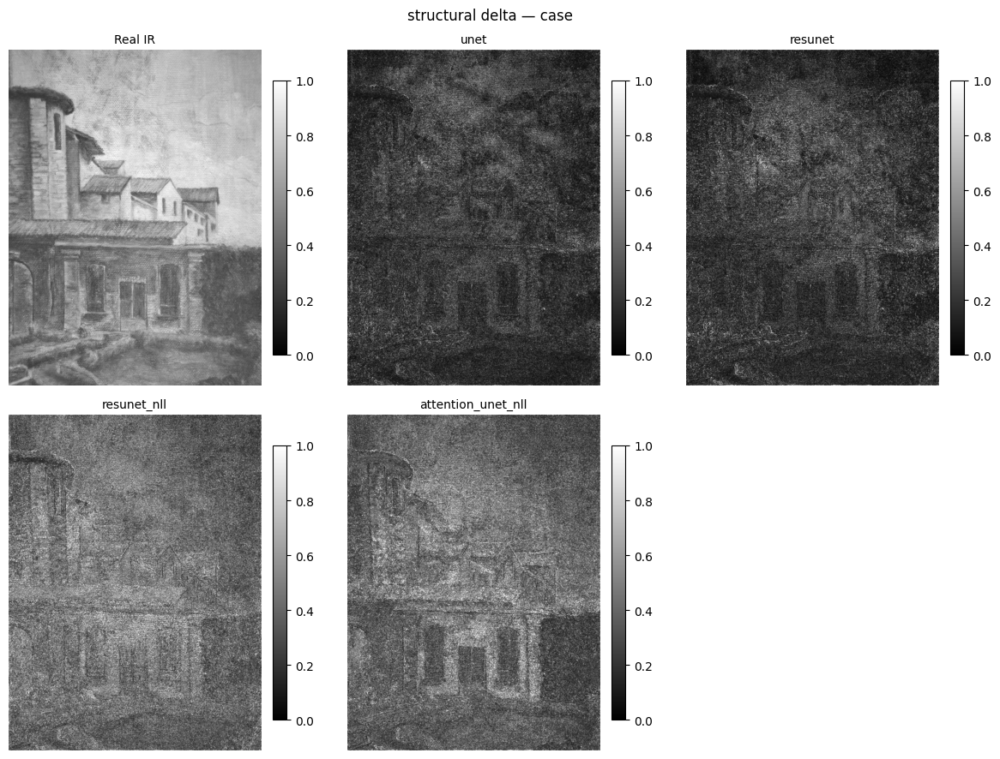

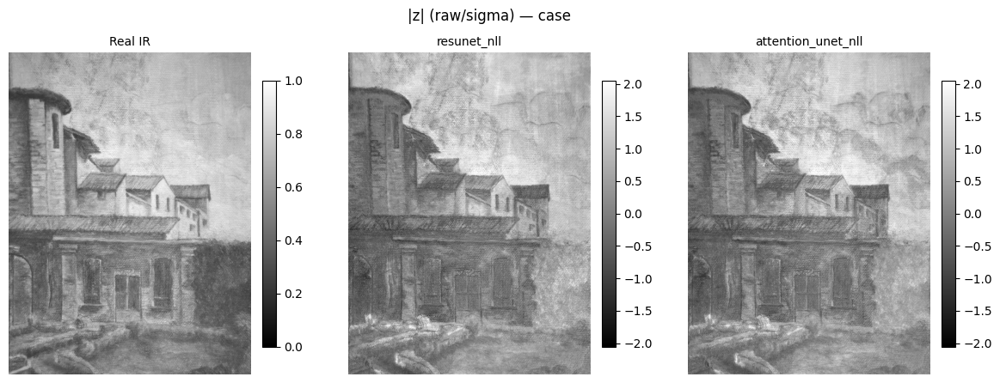

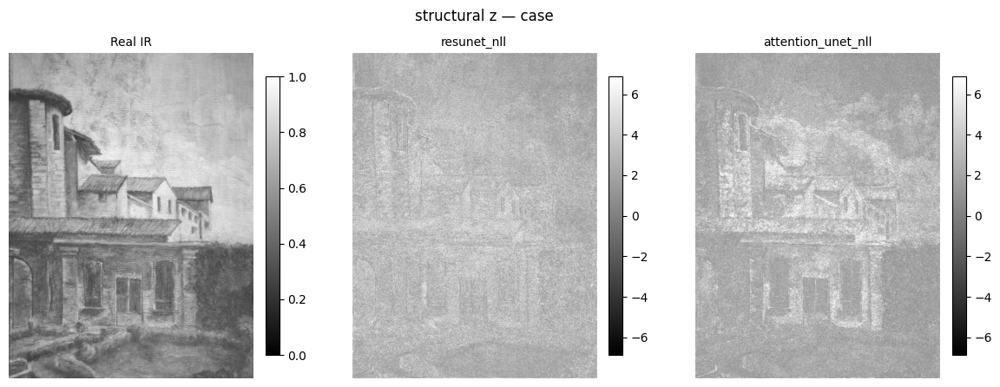


=== face ===


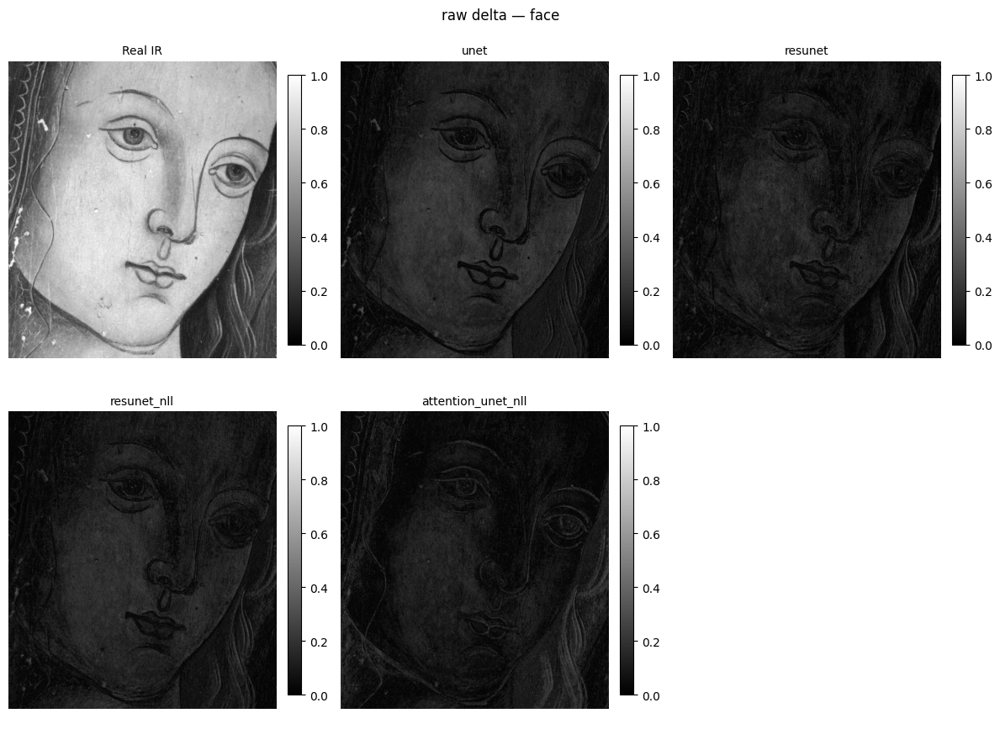

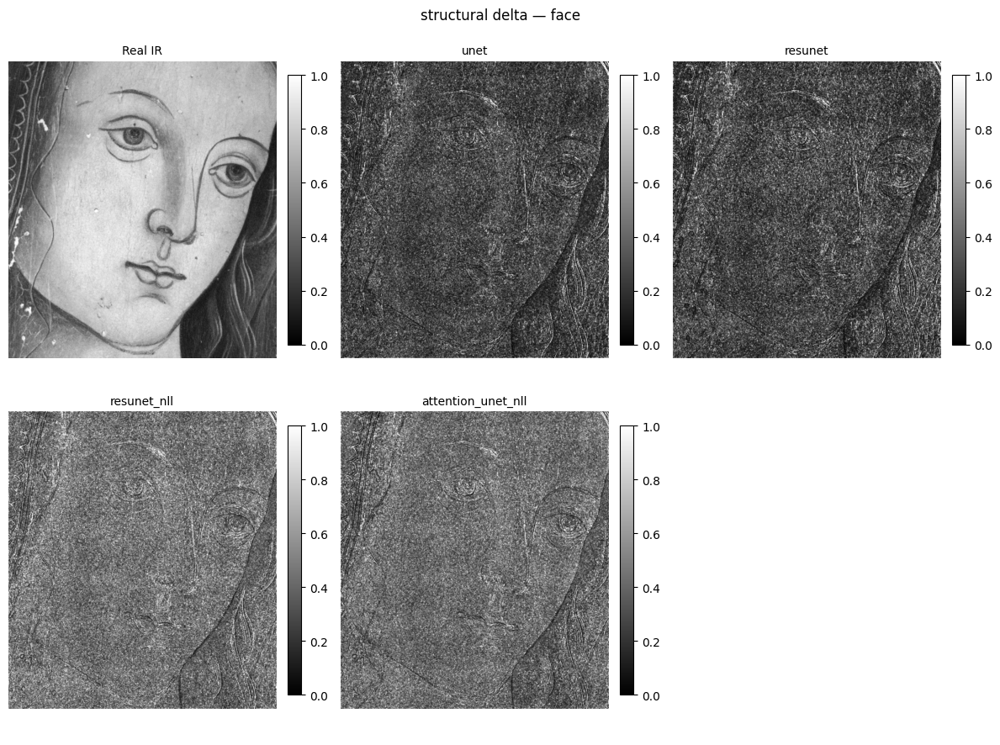

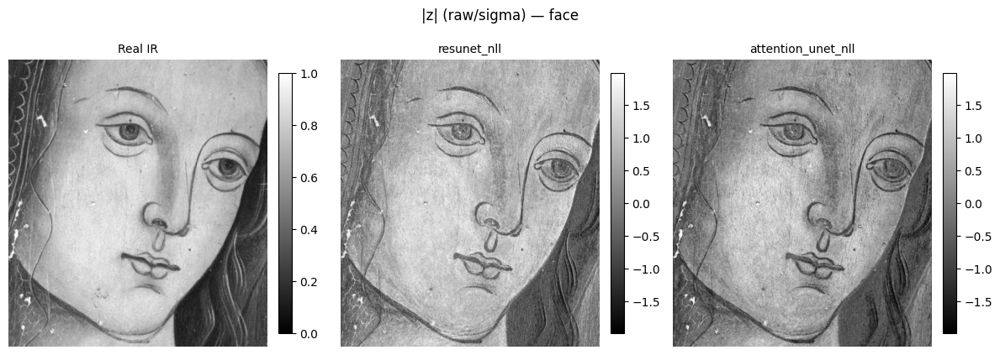

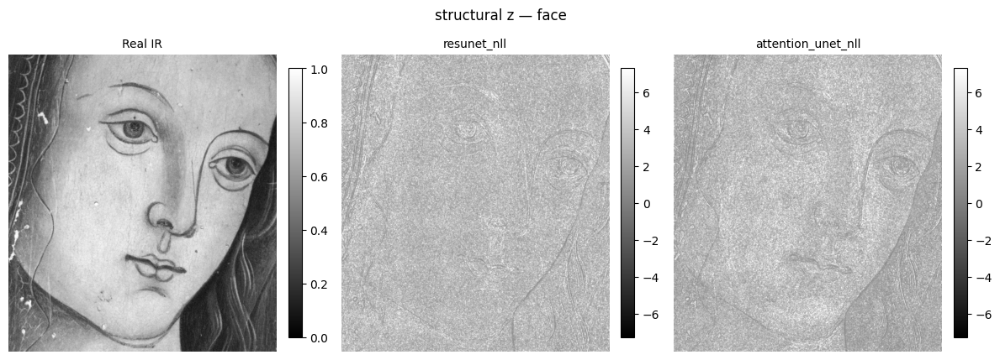


=== green ===


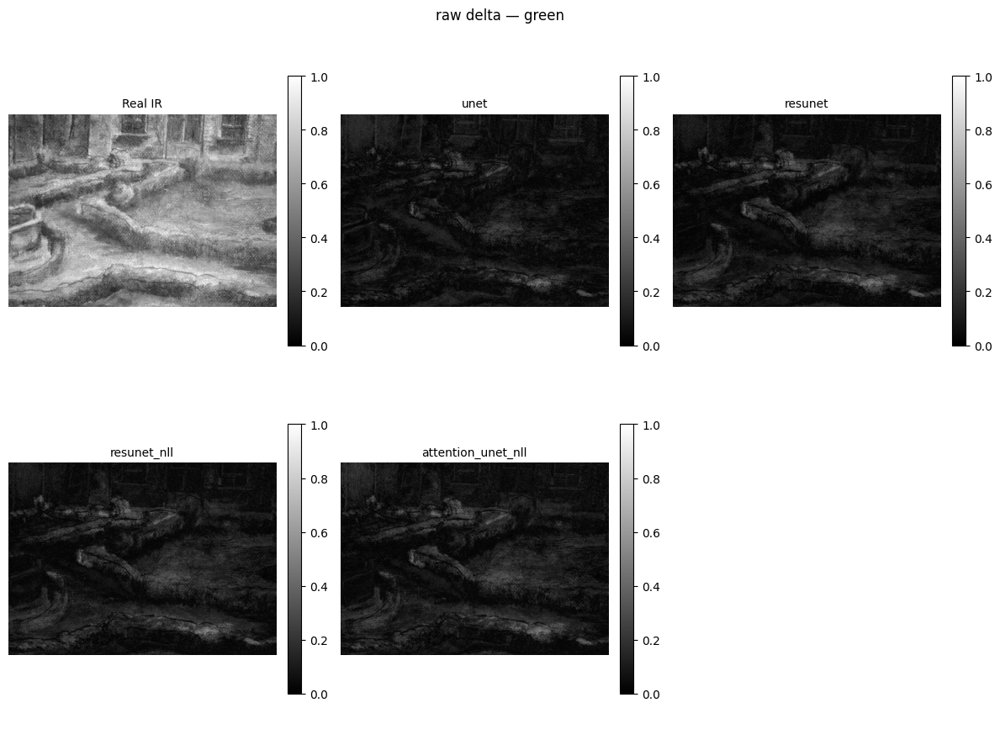

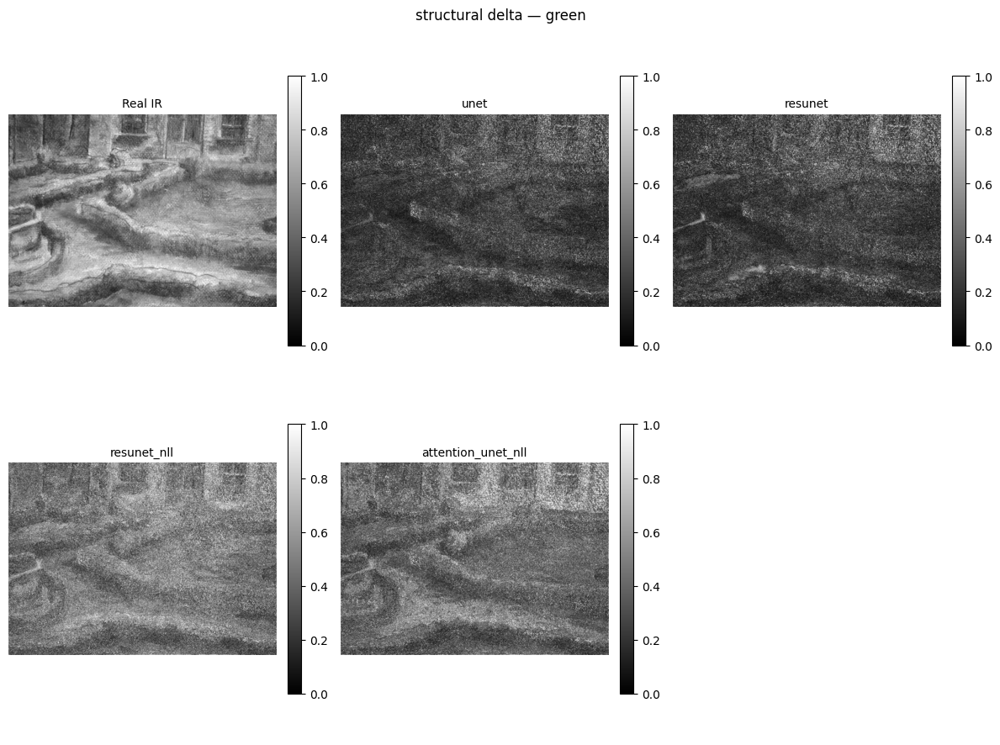

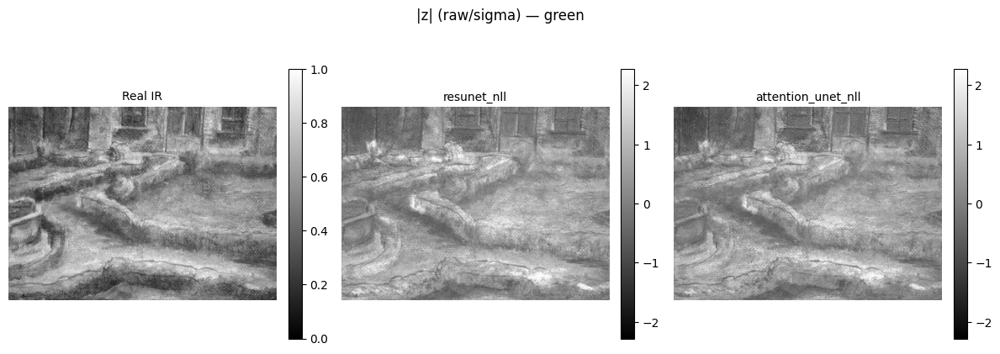

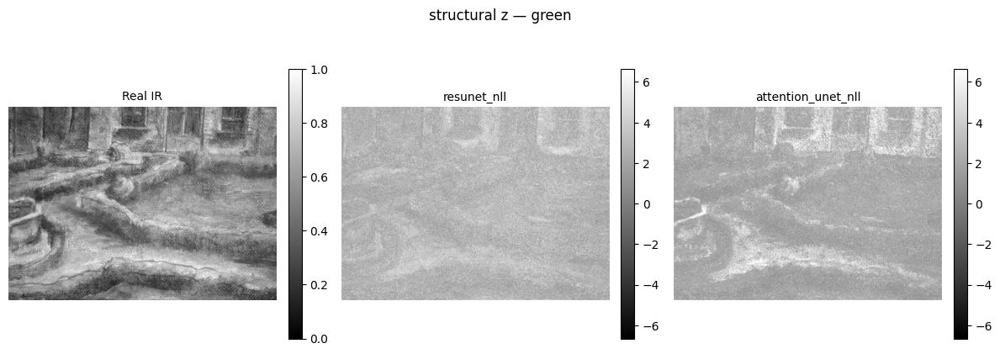


=== modern ===


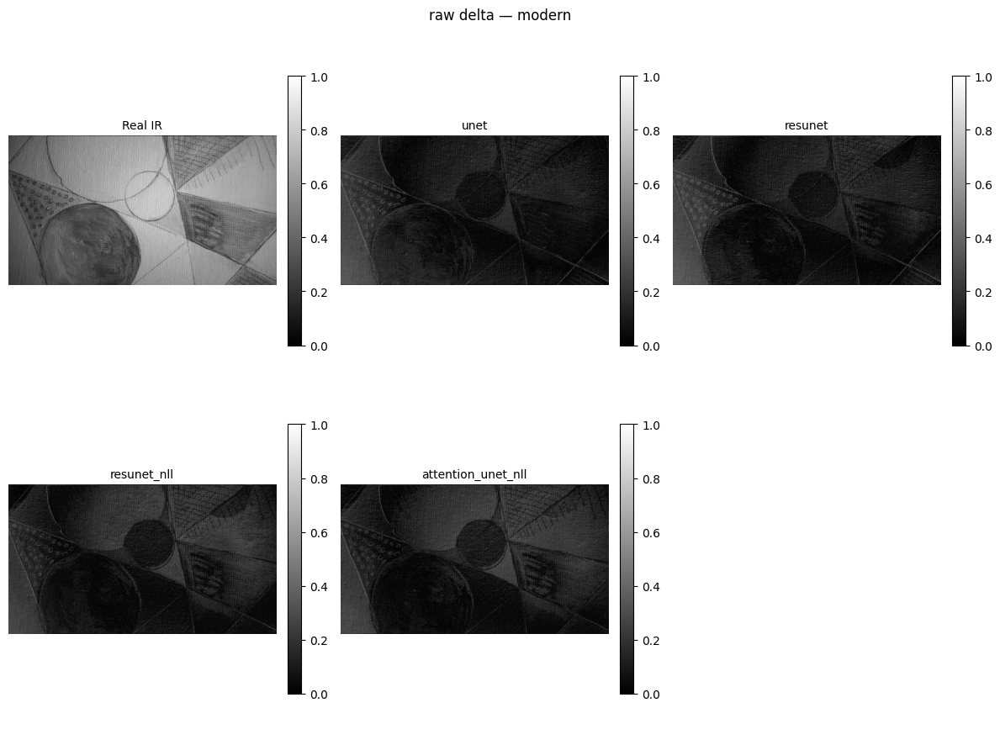

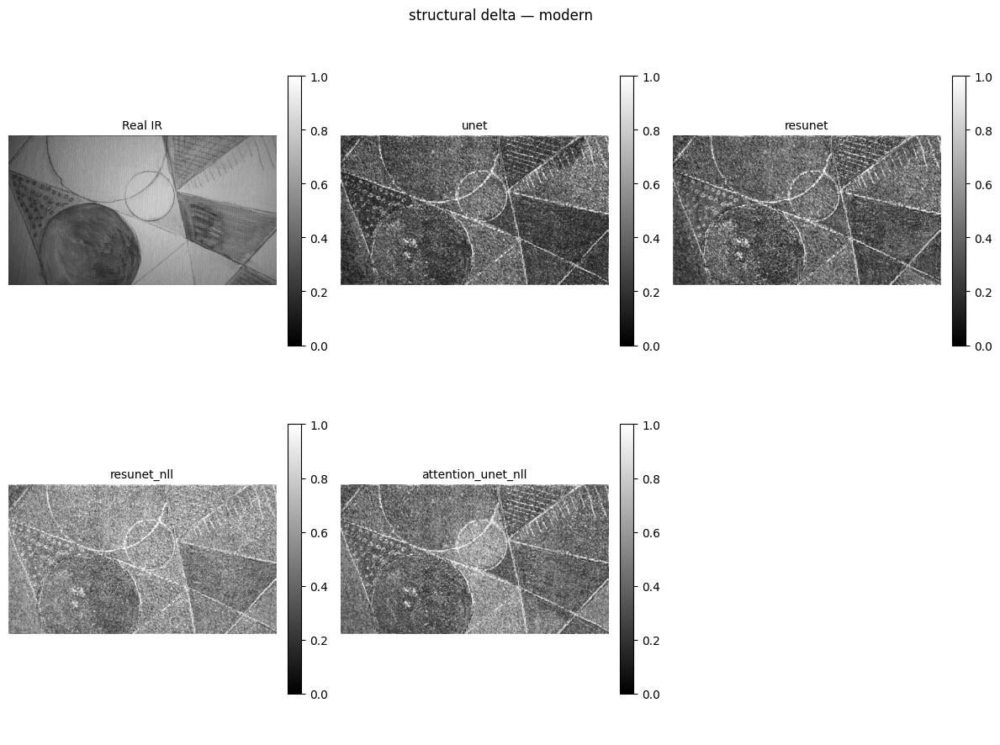

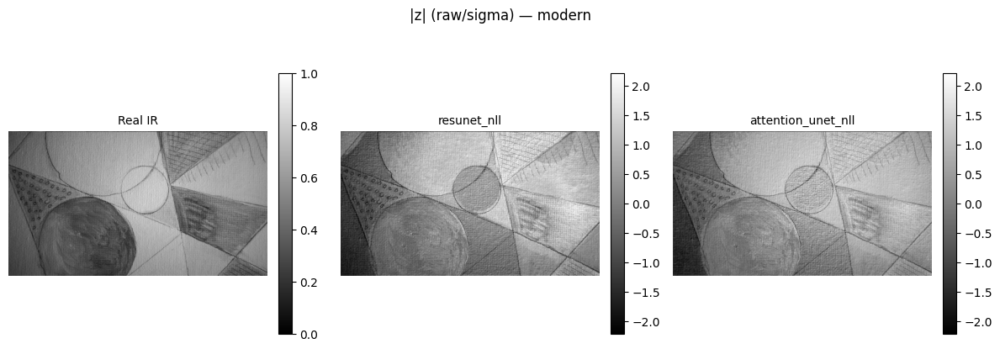

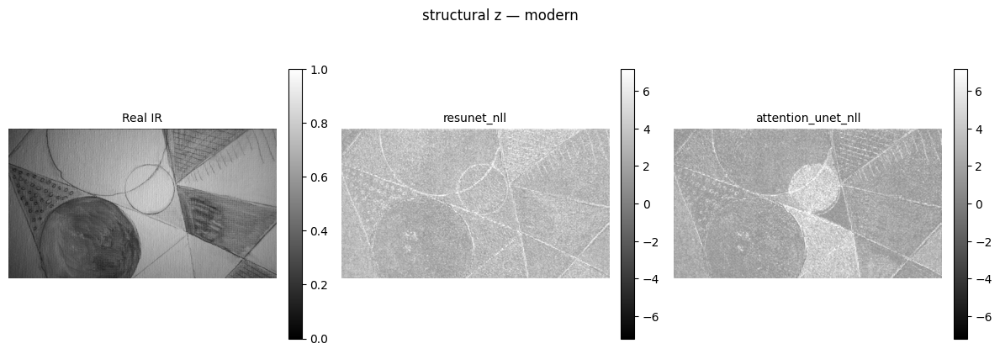


=== modern2 ===


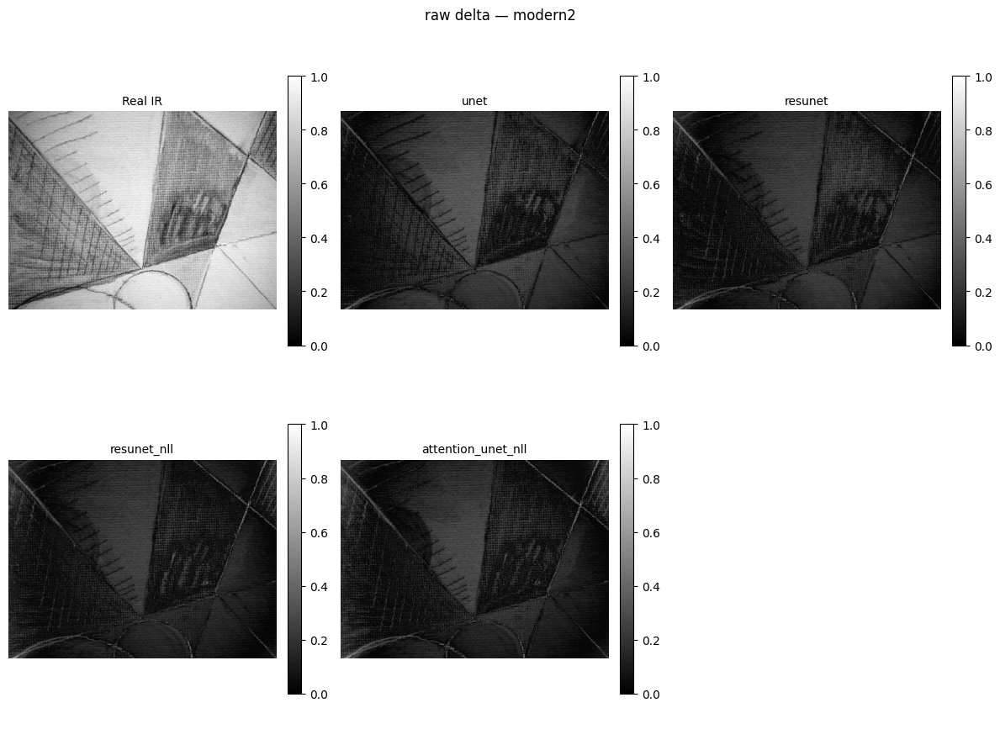

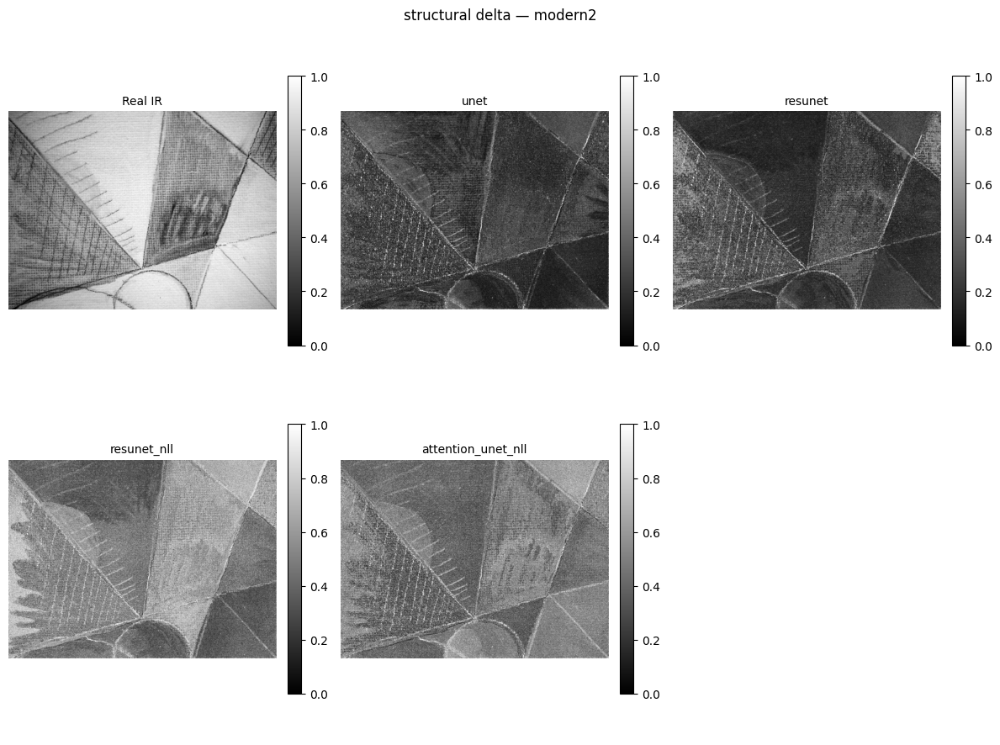

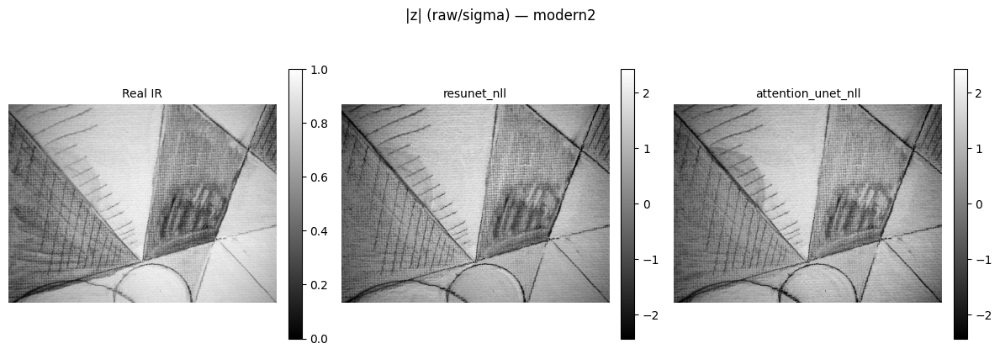

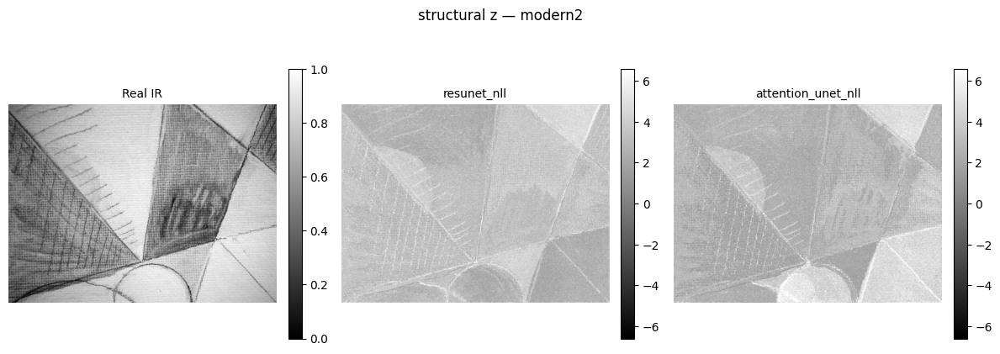


=== total ===


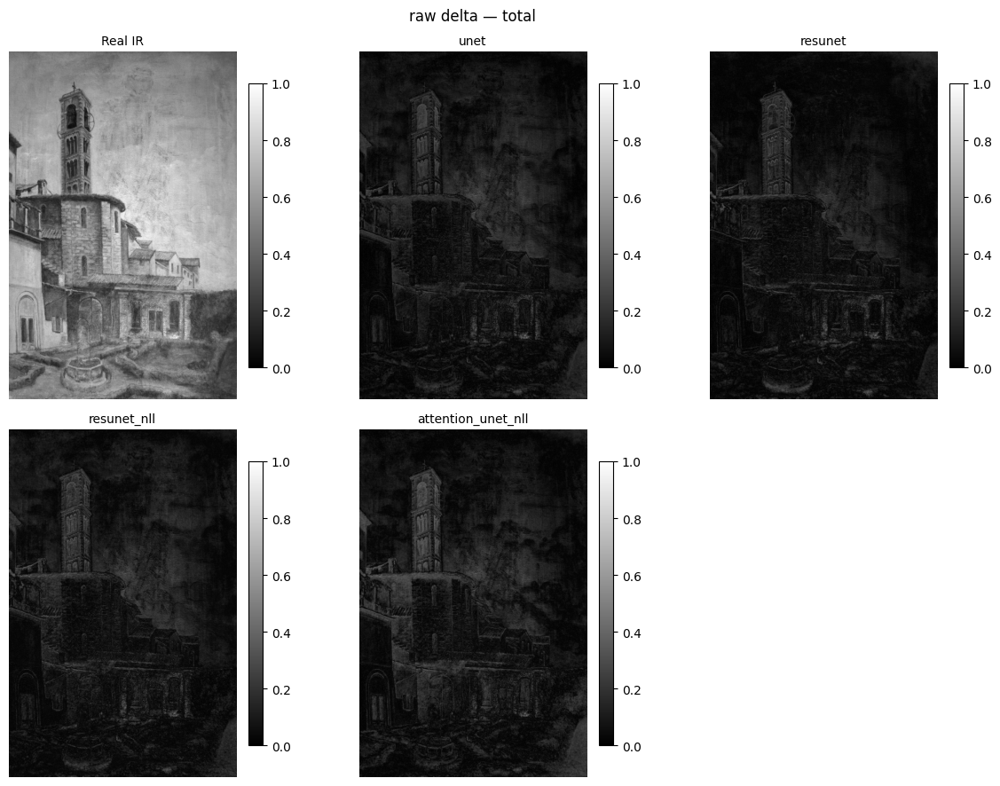

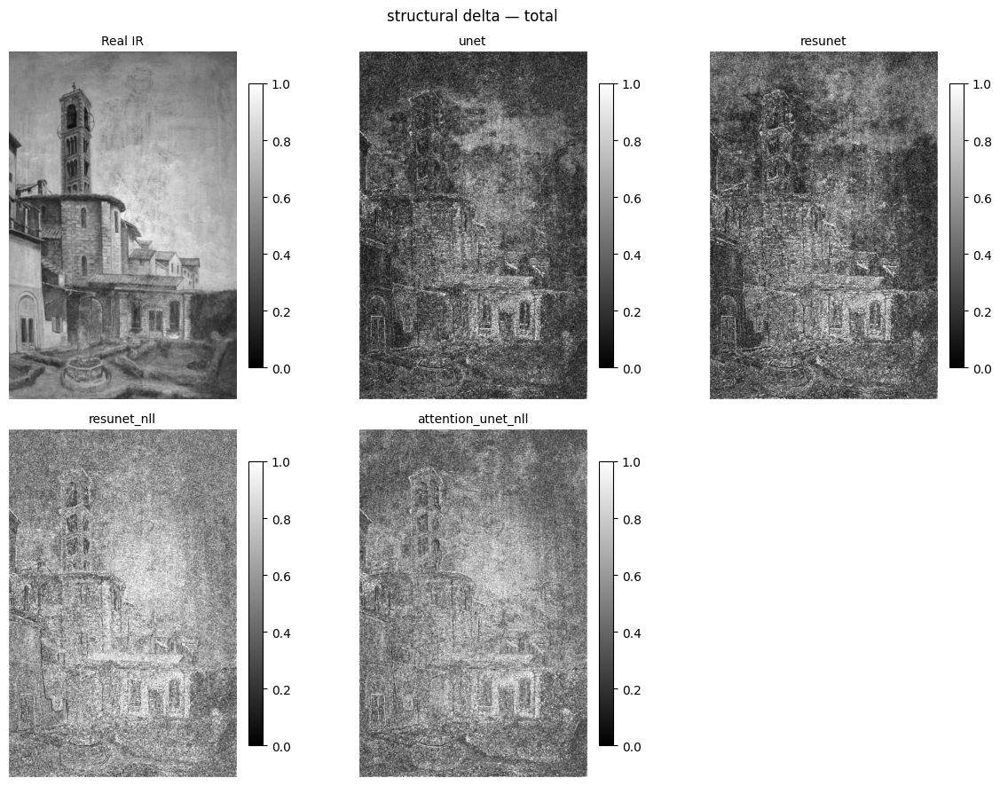

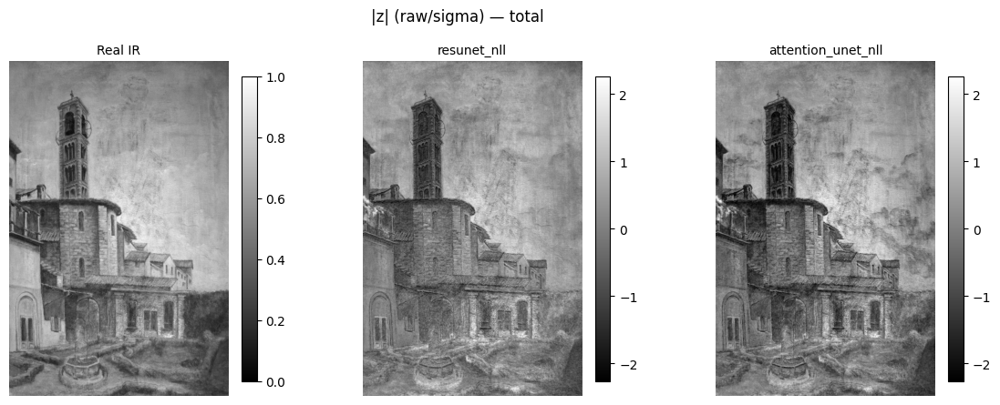

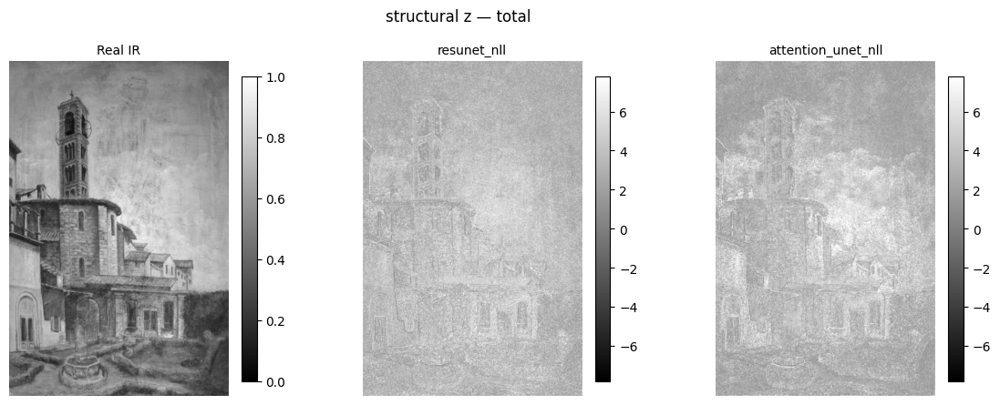

In [5]:
coherence_rows: dict[str, list[float]] = {}

for rgb_path, ir_path in image_pairs:
    print(f"\n=== {rgb_path.stem} ===")
    rgb, ir = load_pair(rgb_path, ir_path)
    signals = signals_for(rgb, ir)

    for kind in ("raw delta", "structural delta"):
        plot_signal_comparison(
            ir, signals[kind], title=f"{kind} — {rgb_path.stem}", vrange=(0.0, 1.0)
        )
        plt.show()

    for kind in ("|z| (raw/sigma)", "structural z"):
        if not signals[kind]:
            continue
        scaled, vrange = DEFAULT_Z_SCALE.apply_many(signals[kind])
        plot_signal_comparison(
            ir, scaled, title=f"{kind} — {rgb_path.stem}", vrange=vrange
        )
        plt.show()

    for kind, family in signals.items():
        for name, signal in family.items():
            coherence_rows.setdefault(f"{name} [{kind}]", []).append(
                stroke_coherence(signal).coherence
            )

## 5. Stroke coherence

In [6]:
coherence_mean = {
    name: (float(np.mean(v)), float(np.std(v))) for name, v in coherence_rows.items()
}
by_coherence = sorted(coherence_mean, key=lambda n: coherence_mean[n][0], reverse=True)

col_w = 45
print("signal".ljust(col_w) + "coherence (mean ± std over images)")
print("-" * (col_w + 34))
for name in by_coherence:
    c, c_sd = coherence_mean[name]
    print(f"{name.ljust(col_w)}{c:.4f} ± {c_sd:.3f}")

signal                                       coherence (mean ± std over images)
-------------------------------------------------------------------------------
unet [structural delta]                      0.3566 ± 0.065
resunet [structural delta]                   0.3513 ± 0.062
attention_unet_nll [structural delta]        0.2967 ± 0.051
attention_unet_nll [structural z]            0.2908 ± 0.057
resunet_nll [structural delta]               0.2807 ± 0.043
resunet_nll [structural z]                   0.2753 ± 0.040
unet [raw delta]                             0.2439 ± 0.069
resunet [raw delta]                          0.2436 ± 0.068
attention_unet_nll [raw delta]               0.2035 ± 0.055
attention_unet_nll [|z| (raw/sigma)]         0.1910 ± 0.038
resunet_nll [raw delta]                      0.1780 ± 0.039
resunet_nll [|z| (raw/sigma)]                0.1778 ± 0.032
